In [1]:
import pandas as pd
import numpy as np
import scanpy as sc
import scanpy.external as sce
from matplotlib.pyplot import rc_context

In [2]:
adata = sc.read("/Users/athib/Desktop/CovidRSV/scRNA2/HarmonyCorrected.h5ad")

In [3]:
len(adata.obs.index)

389228

In [4]:
len(np.unique(adata.obs.index))

389228

In [40]:
sc.set_figure_params(dpi=100, color_map = 'viridis')
sc.settings.verbosity = 3

In [6]:
sc.pp.neighbors(adata, n_pcs=50, use_rep="X_pca_harmony")


computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:04:30)


In [7]:
sc.tl.umap(adata)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:07:26)


In [8]:
sc.tl.leiden(adata)

running Leiden clustering
    finished: found 26 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:11:11)


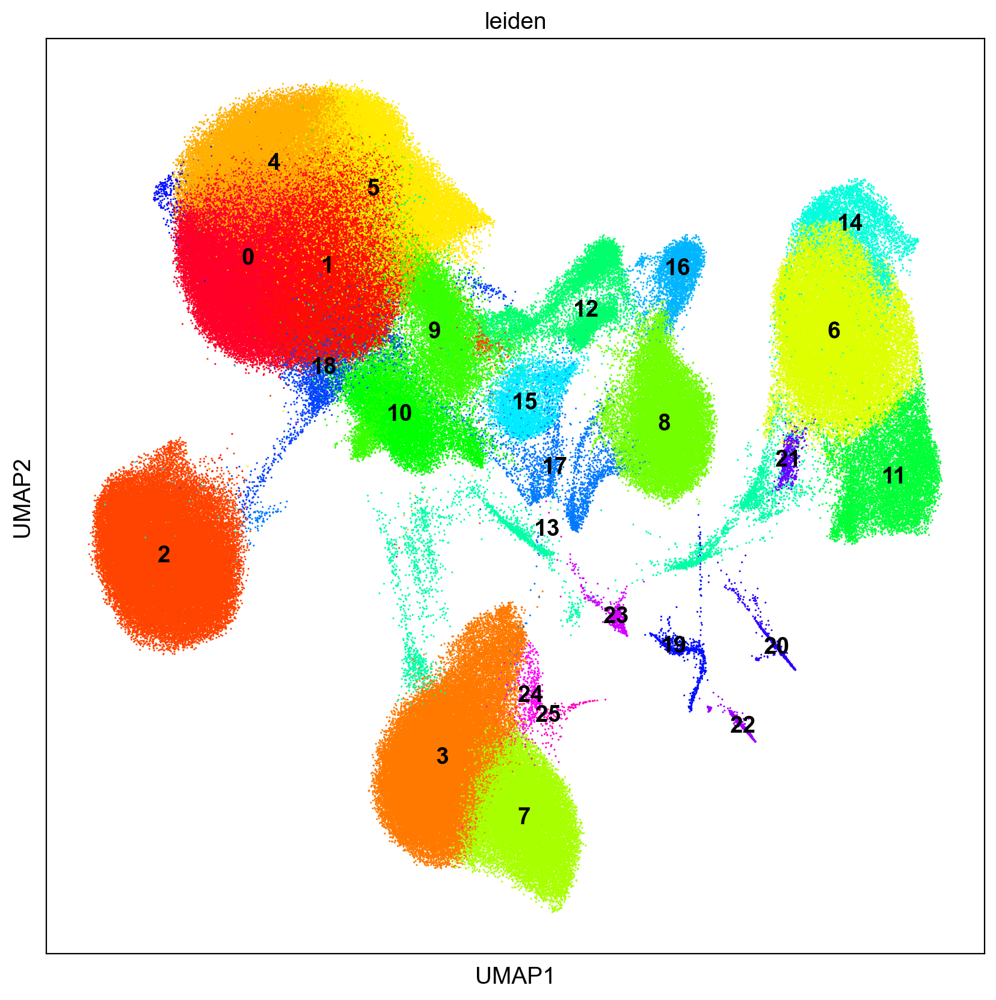

In [41]:
with rc_context({'figure.figsize': (10, 10)}):
    sc.pl.umap(adata, color='leiden', size=5, palette="gist_rainbow", add_outline=False,legend_loc="on data")
    

In [11]:
sc.set_figure_params(dpi=300, color_map = 'viridis')
sc.settings.verbosity = 3

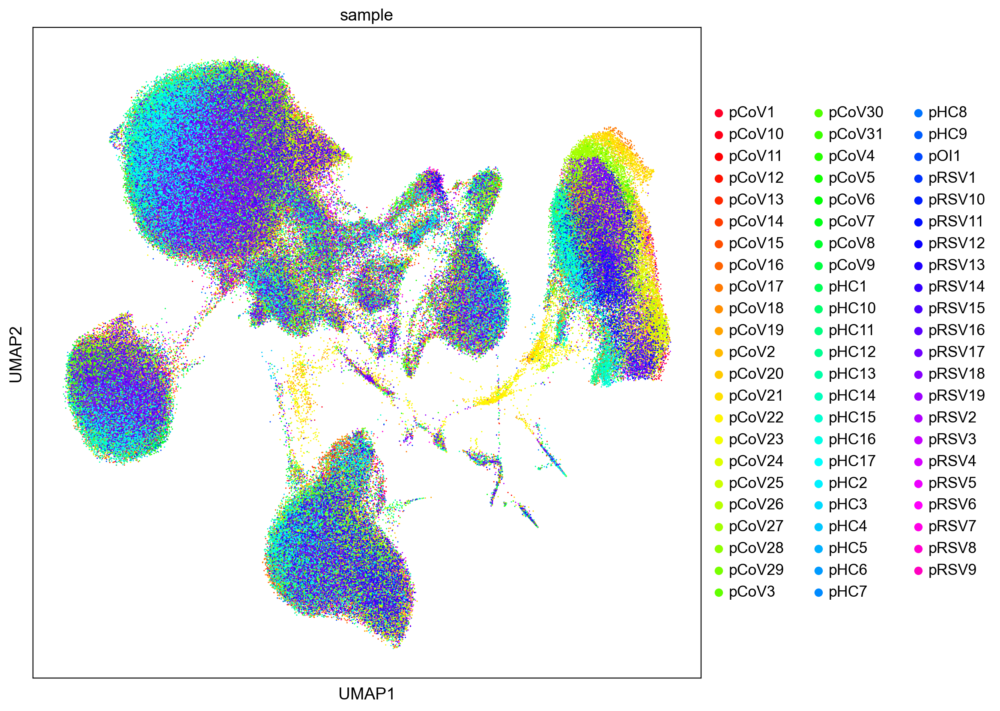

In [42]:
with rc_context({'figure.figsize': (10, 10)}):
    sc.pl.umap(adata, color='sample', size=5, palette="gist_rainbow", add_outline=False)

In [31]:
adata.obs['Batch'] = adata.obs['Batch'].apply(str)

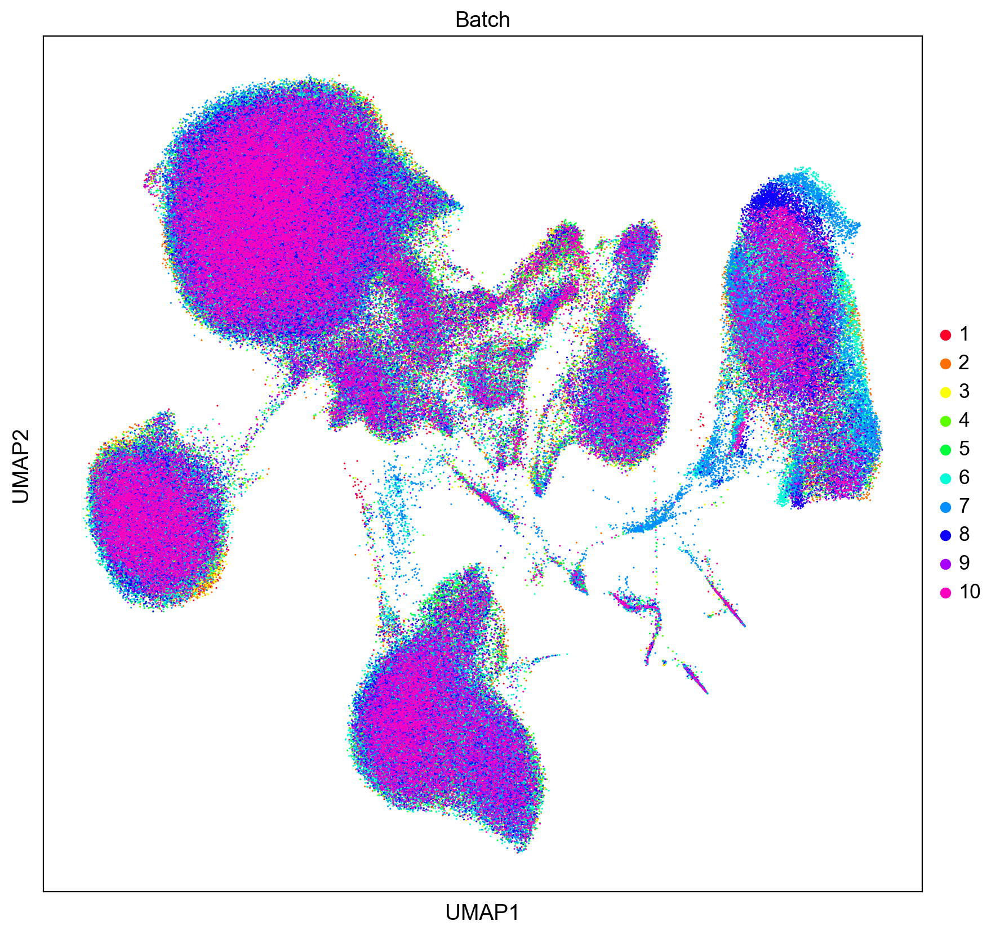

In [43]:
with rc_context({'figure.figsize': (10, 10)}):
    sc.pl.umap(adata, color='Batch', size=5, palette="gist_rainbow", add_outline=False)
    

In [15]:
markerdict = dict()

markerdict["T"] = ["CD3E","CD3D", "CD3G"]
markerdict["Naive T"] = ["LEF1","IL7R"]
markerdict["CD4"] = ["CD4"]
markerdict["CD8"] = ["CD8A", "CD8B"]
markerdict["TREG"] = ["FOXP3"]
markerdict["γδ T"] = ["TRDC","TRGC2"]
markerdict["MAIT"] = ["KLRB1"]
markerdict["NK"] = ["NKG7", "NCAM1"]
markerdict["B"] = ["MS4A1", "CD79A"]
markerdict["PCs"] = ["JCHAIN", "MZB1", "TNFRSF17"]
markerdict["pDCs"] = ["IRF7", "TCF4"]
markerdict["Myeloid"] = ["LYZ"]
markerdict["CD14"] = ["CD14"]
markerdict["CD16"] = ["FCGR3A"]
markerdict["DC"] = ["CD1C", "CST3", "FCER1G"]
markerdict["MGK"] = ["PPBP","PF4"]
markerdict["RBC"] = ["HBB"]
markerdict["HSC"] = ["CD34"]
markerdict["Eryth"] = ["ALAS2"]
markerdict["Prolif"] = ["MKI67"]
markerdict["HSC"] = ["CD34"]
markerdict["ISG"] = ["IFI44L", "ISG15", "IFI6", "IFI27", "IFI44"]


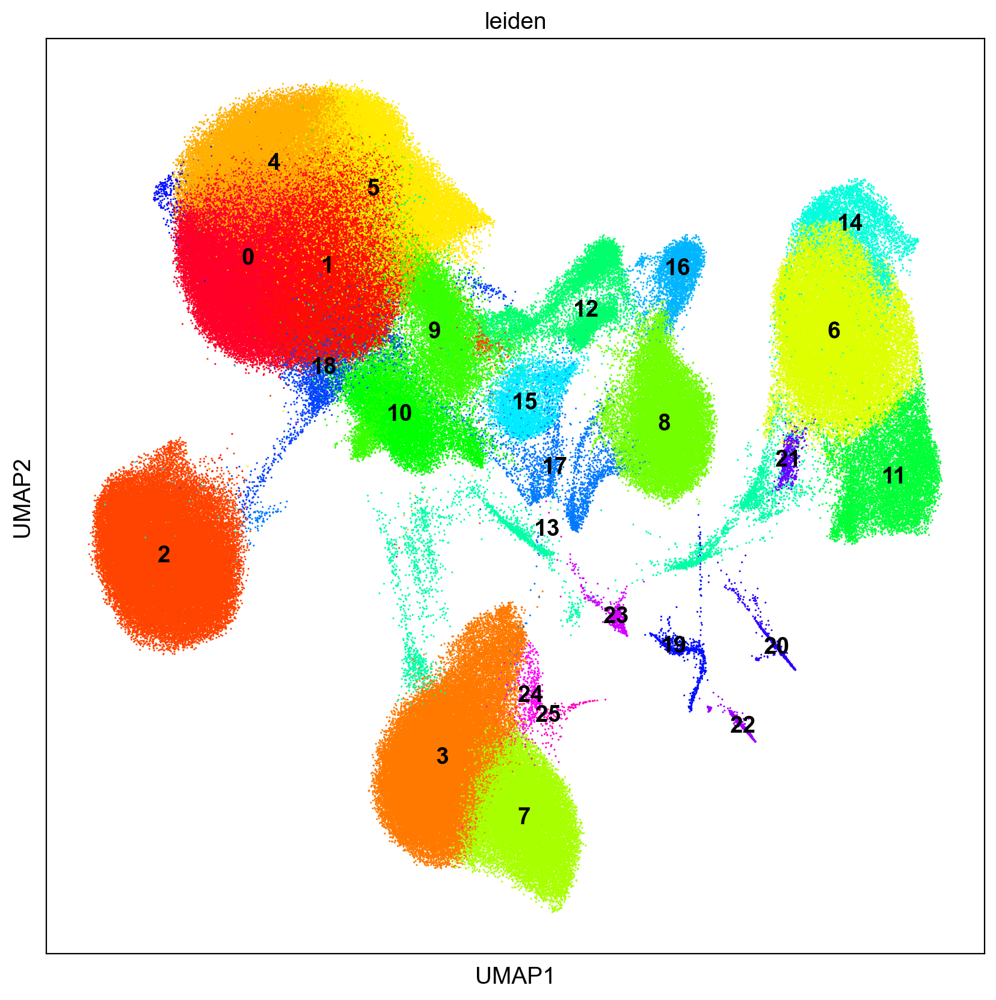

In [44]:
with rc_context({'figure.figsize': (10, 10)}):
    sc.pl.umap(adata, color='leiden', size=5, palette="gist_rainbow", add_outline=False,legend_loc="on data")
    

categories: 0, 1, 2, etc.
var_group_labels: T, Naive T, CD4, etc.


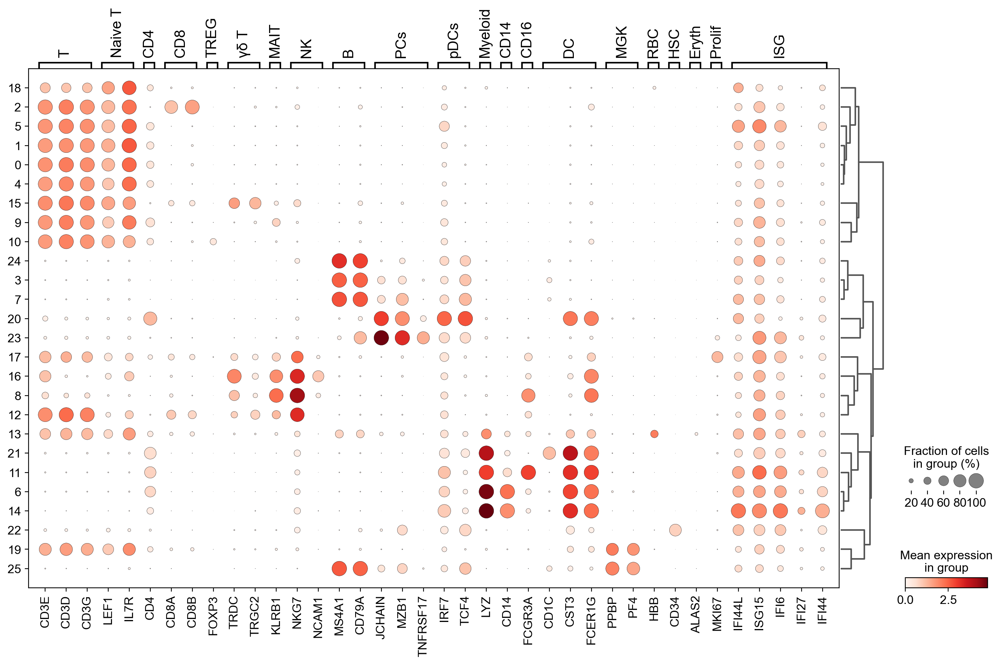

In [45]:
with rc_context({'figure.figsize': (5, 5)}):
    sc.pl.dotplot(adata, markerdict,  
                  groupby='leiden', dendrogram=True);

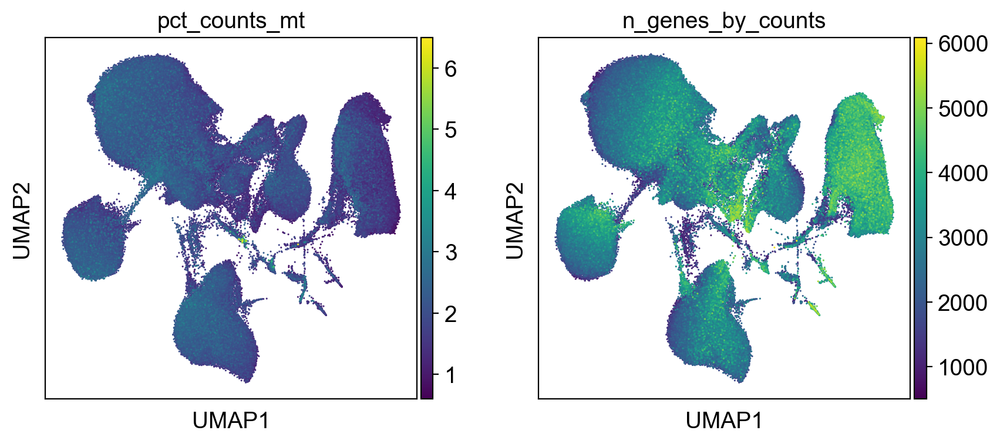

In [46]:
sc.pl.umap(adata, color=["pct_counts_mt", "n_genes_by_counts"], ncols=2, size=5, add_outline=False)


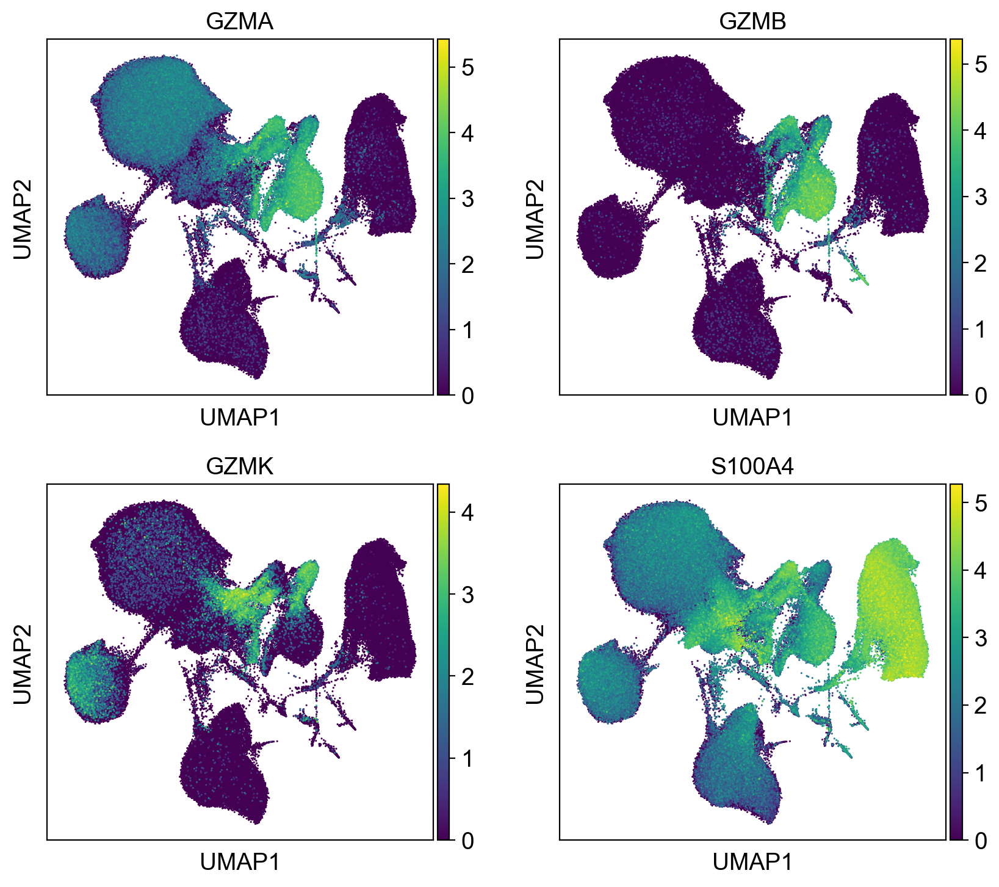

In [47]:
sc.pl.umap(adata, color=['GZMA', "GZMB", "GZMK", 'S100A4'], ncols=2, size=5, add_outline=False)


# Rough Annotations (In order of the dotplot above):
- **18**: CD4 (Naive T)
- **2**: CD8 (Naive T)
- **5,1,0,4**: CD4 (Naive T)
- **15**: GD T (Cytotoxic/Memory T + NK)
- **9**: MAIT (Cytotoxic/Memory T + NK)
- **10**: Treg (Cytotoxic/Memory T + NK)
- **24,3,7**: B Cells (B)
- **20**: pDCs (Myeloid)
- **23**: PBs/PCs (B)
- **17**: Proliferating Cells (Cytotoxic/Memory T + NK)
- **16**: CD56+ NK (Cytotoxic/Memory T + NK)
- **8**: CD16+ NK (Cytotoxic/Memory T + NK)
- **12**: GZMB/GZMK T (Cytotoxic/Memory T + NK)
- **13**: Mixture of different cell populations (Split and Put into other groups)
- **21**: cDCs (Myeloid)
- **11**: CD16+ Monocytes (Myeloid)
- **6,14** CD14+ Monocytes (Myeloid)
- **22** HSC (HSC)
- **19** MGK (MGK)
- **25** B MGK (B)

(Subclustering according to paranethesis(), will put 13 in others)

# Cluster 13 Subclusters

In [20]:
c13 = adata[adata.obs['leiden'].isin(['13'])].copy()
sc.pp.neighbors(c13, use_rep="X_pca_harmony")
sc.tl.umap(c13)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:08)


In [21]:
sc.tl.leiden(c13)

running Leiden clustering
    finished: found 15 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


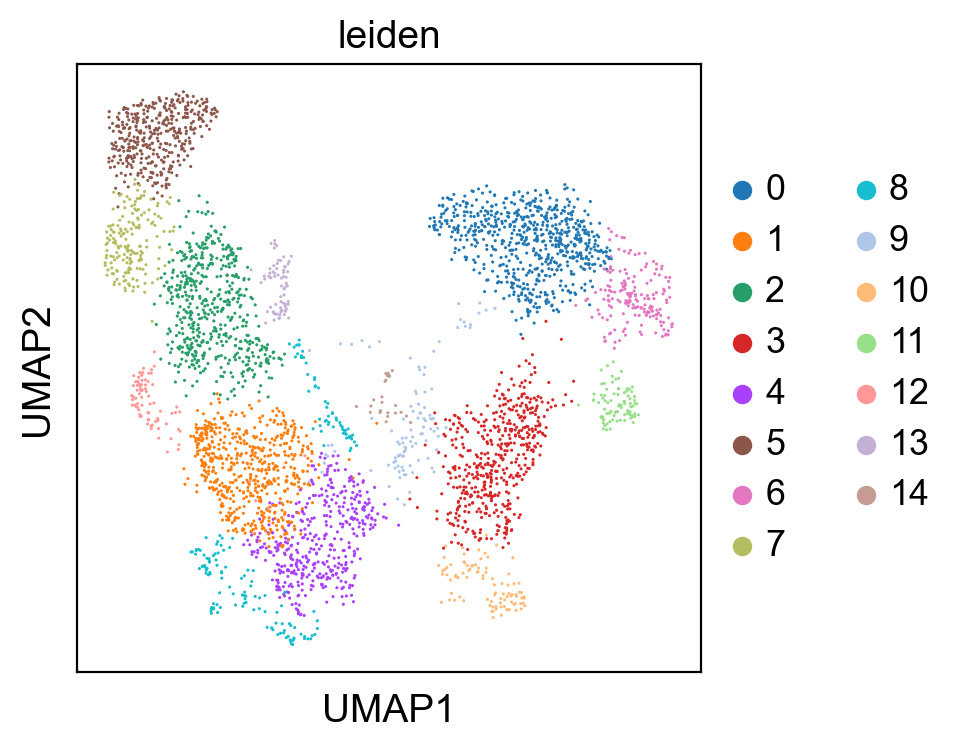

In [48]:

sc.pl.umap(c13, color=['leiden'], size=5, add_outline=False)


In [23]:
sc.tl.dendrogram(c13, groupby='leiden')

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_leiden']`


categories: 0, 1, 2, etc.
var_group_labels: T, Naive T, CD4, etc.


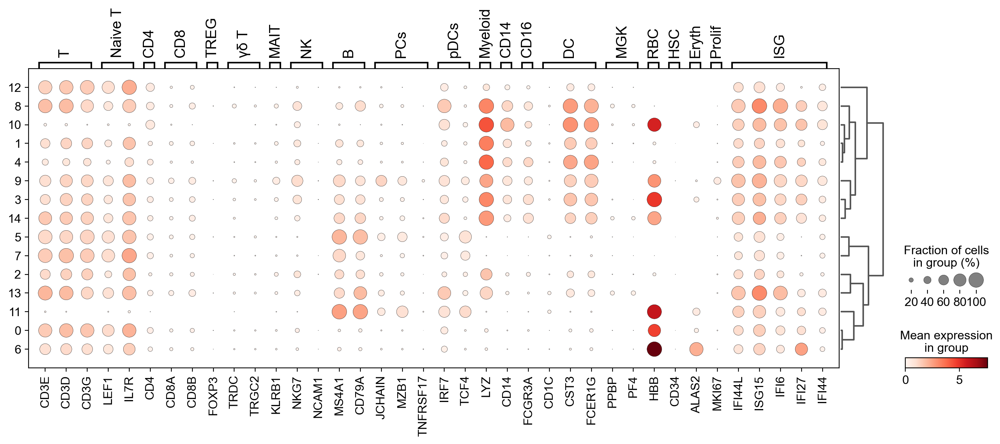

In [49]:
with rc_context({'figure.figsize': (5, 5)}):
    sc.pl.dotplot(c13, markerdict,  
                  groupby='leiden', dendrogram=True);

In [25]:
adata.obs['C13_Annotation'] = None

In [26]:
adata.obs['C13_Annotation'][adata.obs.index.isin(c13.obs.index)] =  c13.obs['leiden']

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


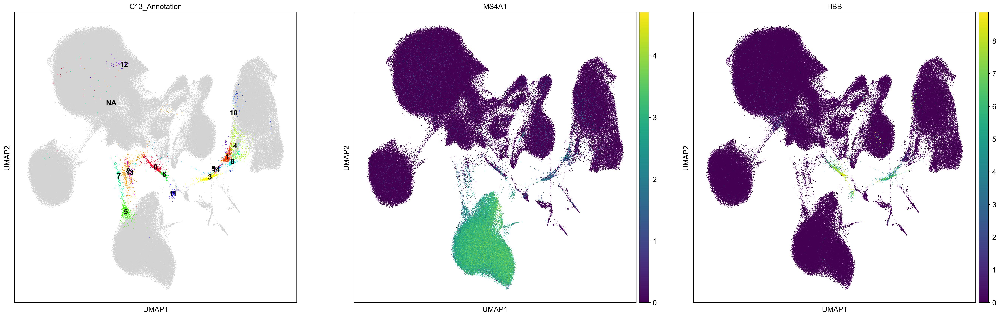

In [50]:
with rc_context({'figure.figsize': (10, 10)}):
    sc.pl.umap(adata, color=['C13_Annotation', 'MS4A1', 'HBB'], size=5, palette="gist_rainbow", add_outline=False,legend_loc="on data")
    

Will subcluster 0 and 6 to identify Erythroblasts, rest are doublets or HBB+